# Анализ оттока клиентов банка

В нашем распоряжении данные о клиентах банка из трех городов:  Ярославля, Ростова Великого и Рыбинска.  
  
**Цель проекта:** проанализировать клиентов банка и выделить сегменты клиентов, которые склонны уходить из банка.  
  
На основании отобранных сегментов, менеджерами банка будут приняты целевые меры по удержанию отточных клиентов.

**Описание данных** (колонки):  
  
USERID — идентификатор пользователя,  
score — баллы кредитного скоринга,  
city — город,  
gender — пол,  
age — возраст,  
equity — количество баллов собственности,  
balance — баланс на счёте,  
products — количество продуктов, которыми пользуется клиент,  
credit_card — есть ли кредитная карта,  
last_activity — активный клиент,  
EST_SALARY — оценочный доход клиента,  
сhurn — признак оттока.

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly import graph_objects as go
from itertools import combinations, product

## Откроем файл с данными и изучим общую информацию.

### Загрузим файл и отобразим датафрейм.

In [2]:
try:
    df = pd.read_csv('/datasets/bank_scrooge.csv')
except FileNotFoundError:
    print("File not found.")

In [3]:
df

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
0,183012,850.0,Рыбинск,Ж,25.0,1,59214.82,2,0,1,75719.14,1
1,146556,861.0,Рыбинск,Ж,37.0,5,850594.33,3,1,0,86621.77,0
2,120722,892.0,Рыбинск,Ж,30.0,0,NaN,1,1,1,107683.34,0
3,225363,866.0,Ярославль,Ж,51.0,5,1524746.26,2,0,1,174423.53,1
4,157978,730.0,Ярославль,М,34.0,5,174.00,1,1,0,67353.16,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,120553,814.0,Рыбинск,М,27.0,1,78144.65,1,0,1,18943.64,0
9996,139170,894.0,Ярославль,М,46.0,0,NaN,1,1,0,196898.29,0
9997,115639,903.0,Ярославль,М,24.0,0,NaN,2,1,1,108905.09,0
9998,148700,777.0,Ярославль,Ж,68.0,3,865457.97,3,0,1,86874.90,0


Всего 10000 строк и 12 столбцов. Есть пропущенные значения. В названиях столбцов присутствуют прописные буквы, нужно заменить строчными.

###  Посмотрим, какие есть столбцы и какого они типа.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   USERID         10000 non-null  int64  
 1   score          10000 non-null  float64
 2   city           10000 non-null  object 
 3   gender         10000 non-null  object 
 4   age            9974 non-null   float64
 5   equity         10000 non-null  int64  
 6   balance        7705 non-null   float64
 7   products       10000 non-null  int64  
 8   credit_card    10000 non-null  int64  
 9   last_activity  10000 non-null  int64  
 10  EST_SALARY     10000 non-null  float64
 11  churn          10000 non-null  int64  
dtypes: float64(4), int64(6), object(2)
memory usage: 937.6+ KB


Типы данных в основном нормальные. Тип данных столбцов age и score можно заменить на int. В двух столбцах (age и balance) есть пропущенные значения. 

### Вывод.

Данные загружены. Установлено, что:  
- всего в данных 12 столбцов и 10000 строк; 
- тип данных столбцов age и score можно заменить на int, для экономии памяти также можно заменить типы int64 на int8 и int32;
- в некоторых столбцах есть пропущенные значения.

## Предобработка данных.

###  Исследуем пропущенные значения.

In [5]:
df.isna().sum()

USERID              0
score               0
city                0
gender              0
age                26
equity              0
balance          2295
products            0
credit_card         0
last_activity       0
EST_SALARY          0
churn               0
dtype: int64

В столбце age 26 пропущенных значений, в balance - 2295.

In [6]:
def pass_value_barh(df):
    """Визуализация процента пропущенных значений"""
    try:
        pass_value = (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns={0:'space'})
            .query('space > 0')
            .sort_values(by='space', ascending=True)
        )
        fig = px.bar(pass_value,x='space', y=pass_value.index, text='space')
        fig.update_layout(
        title='Процент пропущенных значений в столбцах',
        title_x=0.5,
        xaxis_title='Процент пропущенных значений',
        yaxis_title='Столбец',
        xaxis=dict(range=[0, 100]))
        fig.show()   
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')

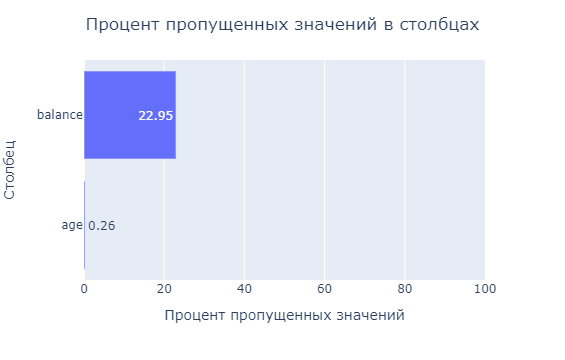

In [7]:
pass_value_barh(df)

Выведем строки, в которых пропущены значения.

In [8]:
df[df['age'].isna()]

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
1247,228075,932.0,Ярославль,М,NaN,5,7601719.20,2,1,1,408121.16,0
2165,187635,692.0,Рыбинск,Ж,NaN,0,NaN,1,1,1,160368.82,0
2444,221156,913.0,Ярославль,М,NaN,0,NaN,1,1,1,135693.24,0
3091,138660,836.0,Ростов,Ж,NaN,5,294315.53,2,0,1,63310.22,1
4912,210674,834.0,Рыбинск,М,NaN,1,238330.52,2,0,1,93775.06,0
5470,218868,827.0,Рыбинск,Ж,NaN,4,448959.07,2,1,1,67835.95,0
5495,151662,884.0,Рыбинск,Ж,NaN,0,NaN,1,1,1,137500.77,0
7236,210135,908.0,Рыбинск,Ж,NaN,4,1120340.31,3,1,1,85002.15,0
7248,219343,920.0,Рыбинск,Ж,NaN,0,NaN,1,1,0,159248.67,0
7345,184913,829.0,Ярославль,Ж,NaN,3,188648.77,2,0,1,75206.90,0


In [9]:
df[df['balance'].isna()]

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
2,120722,892.0,Рыбинск,Ж,30.0,0,NaN,1,1,1,107683.34,0
9,133130,906.0,Ярославль,Ж,67.0,0,NaN,1,0,1,238055.53,0
10,148929,927.0,Ростов,М,52.0,0,NaN,1,1,1,196820.07,0
11,172184,921.0,Ростов,М,41.0,0,NaN,1,1,1,217469.48,0
19,127034,922.0,Рыбинск,Ж,53.0,0,NaN,1,0,0,147094.82,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9976,208085,876.0,Ростов,М,38.0,0,NaN,1,0,0,171763.69,0
9984,125941,729.0,Ярославль,Ж,42.0,0,NaN,1,1,1,687538.70,0
9993,219924,884.0,Рыбинск,Ж,36.0,0,NaN,1,1,1,169844.88,0
9996,139170,894.0,Ярославль,М,46.0,0,NaN,1,1,0,196898.29,0


In [10]:
df.sort_values(by='balance').head(15)

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
6757,148456,813.0,Ярославль,М,20.0,2,0.0,2,1,0,23876.51,0
3900,179831,730.0,Ярославль,М,18.0,0,0.0,2,1,1,64548.33,0
6164,163445,745.0,Рыбинск,Ж,56.0,0,6.0,1,0,1,74698.29,1
3918,133850,729.0,Ярославль,М,39.0,0,7.0,2,1,0,175477.00,0
2876,177010,716.0,Ярославль,Ж,32.0,2,20.0,1,1,0,66443.94,0
8405,165505,736.0,Ярославль,М,38.0,1,21.0,1,1,0,138455.81,0
2885,143309,718.0,Ростов,М,51.0,0,22.0,2,0,1,125234.71,0
2848,148468,721.0,Ростов,М,36.0,2,26.0,2,1,1,102856.89,0
8901,129221,712.0,Ярославль,Ж,39.0,2,26.0,2,1,0,46937.73,0
728,227508,739.0,Ярославль,М,36.0,2,33.0,2,1,0,169612.20,0


Никаких закономерностей в появлении пропусков не видно.  
В столбце age немного пропущенных значений - 0,26%, вероятно их возникновение случайно и заменить их нет возможности. Данные возраста вероятнее всего потребуются для дальнейшего анализа, поэтому удалим строки, содержащие пропущенные значения.  
В столбце balance достаточно много пропусков - 22.95%. Вполне возможно, что пропуски появились вместо 0, так как нулевых значений в столбце всего 2, что достаточно мало для выборки в 10 000 строк. Но достоверно это не известно. Поэтому с пропущенными значениями делать ничего не будем. При категоризации данных столбца balance выделим пропущенные значения в отдельную категорию и посмотрим влияние на признак оттока.

Сделаем датафрейм, в котором значения столбца balance заменим на признаки:
'value' - если есть значение;  
'nan' - если значения нет.  
Построим гистограммы плотности распределения значений параметров, в зависимости от наличия или отсутствия значения в столбце balance.

In [11]:
df_balance = df.copy()
for i in df_balance.index:
    if df_balance.loc[i,'balance'] >= 0:
        df_balance.loc[i,'balance'] = 'value'
    else: df_balance.loc[i,'balance'] = 'nan'
df_balance

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
0,183012,850.0,Рыбинск,Ж,25.0,1,value,2,0,1,75719.14,1
1,146556,861.0,Рыбинск,Ж,37.0,5,value,3,1,0,86621.77,0
2,120722,892.0,Рыбинск,Ж,30.0,0,nan,1,1,1,107683.34,0
3,225363,866.0,Ярославль,Ж,51.0,5,value,2,0,1,174423.53,1
4,157978,730.0,Ярославль,М,34.0,5,value,1,1,0,67353.16,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,120553,814.0,Рыбинск,М,27.0,1,value,1,0,1,18943.64,0
9996,139170,894.0,Ярославль,М,46.0,0,nan,1,1,0,196898.29,0
9997,115639,903.0,Ярославль,М,24.0,0,nan,2,1,1,108905.09,0
9998,148700,777.0,Ярославль,Ж,68.0,3,value,3,0,1,86874.90,0


In [12]:
def density_hist(data, column, parameter, range_x=None):
    """Функция для построения гистограммы распределения плотности вероятности 
    по значению column. Принимает на вход датафрейм data, 
    параметр parameter и диапазон значений range_x."""
    fig = px.histogram(
        data, 
        x=parameter, 
        color=column, 
        histnorm='probability density', 
        barmode='overlay', 
        color_discrete_sequence=['#BA55D3', '#8690FF'], 
        height=600,
        range_x=range_x
    )
    fig.update_layout(
        title=f'Распределение значений параметра {parameter}',
        title_x = 0.5,
        xaxis_title=f'Значение {parameter}',
        yaxis_title='Плотность вероятности',
        legend=dict(
            yanchor="top",
            y=0.99, 
            xanchor="right",
            x=0.99
        ),
        
    )
    if column == 'churn': fig.update_layout(legend_title_text='Признак оттока')
    elif column == 'balance': fig.update_layout(legend_title_text='Наличие значения в balance')
    
    if parameter in ['credit_card', 'last_activity', 'churn']:
        fig.update_xaxes(type='category')
    fig.show()

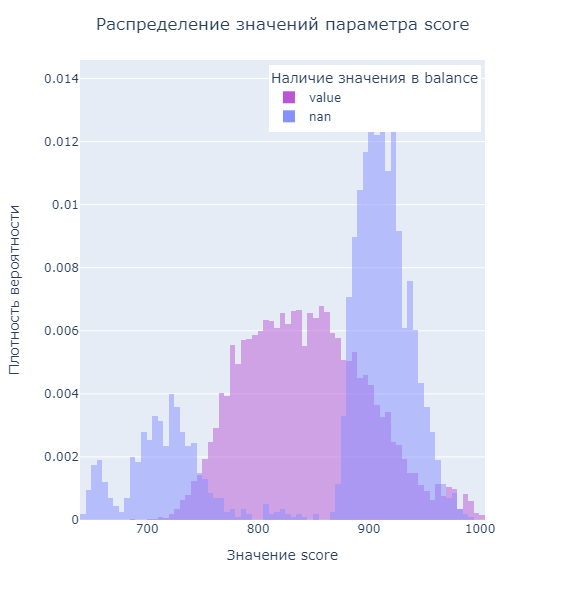

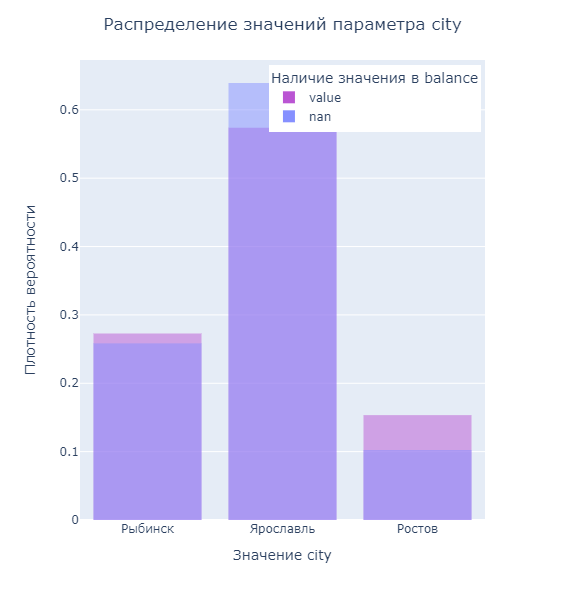

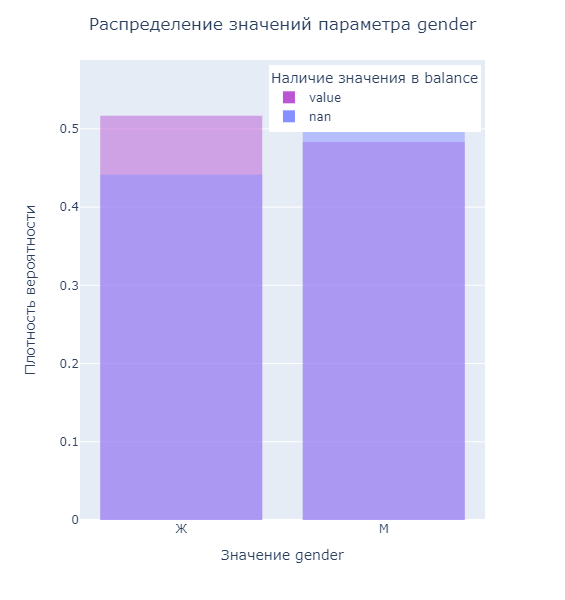

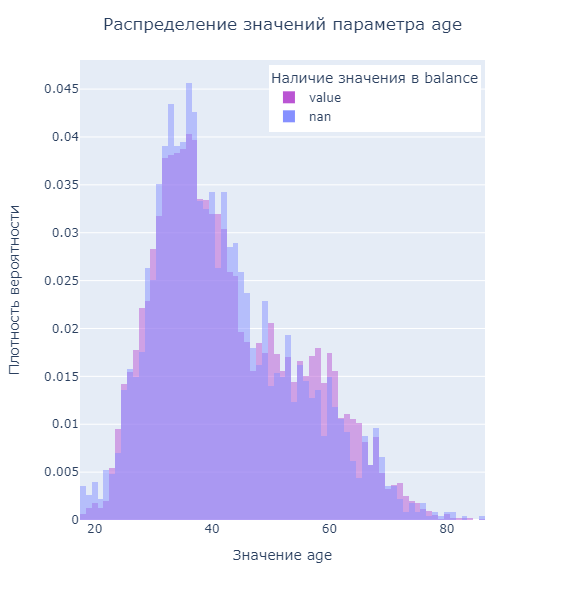

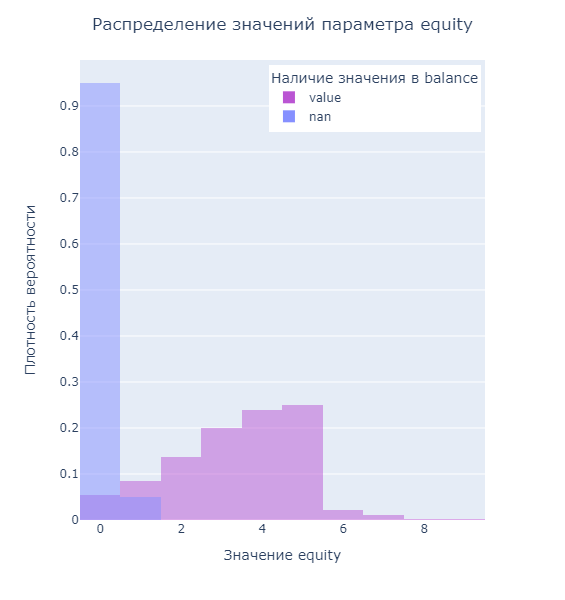

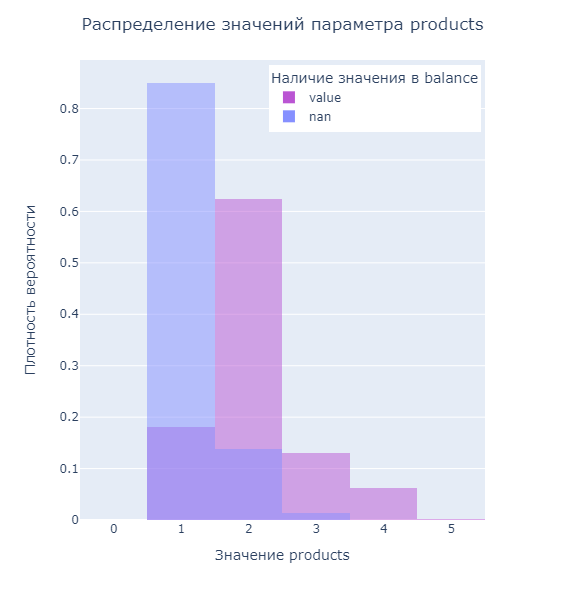

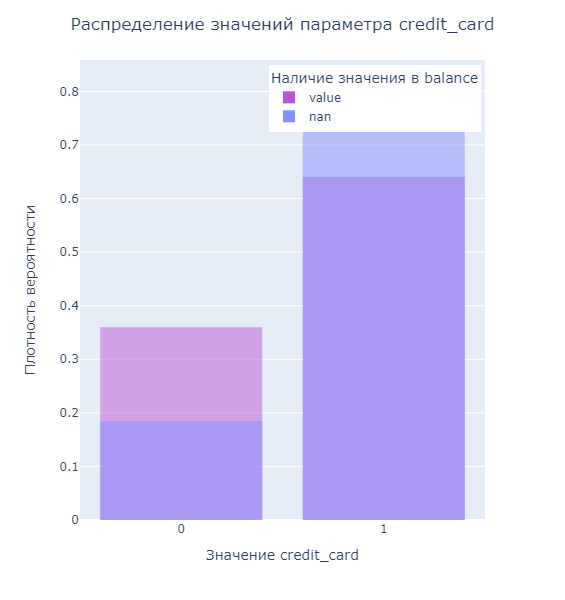

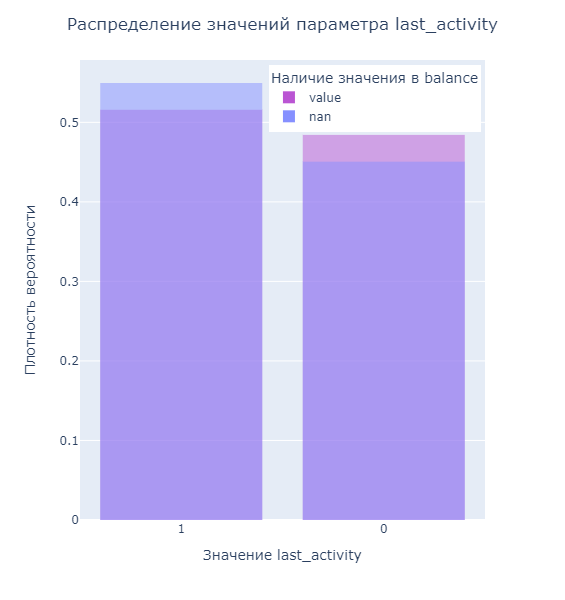

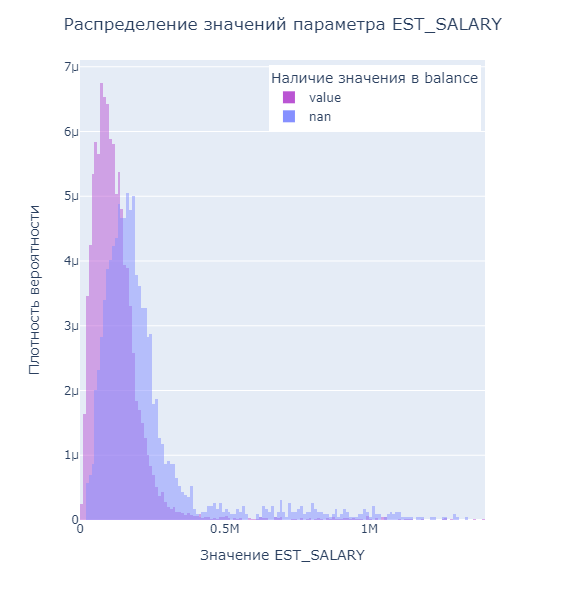

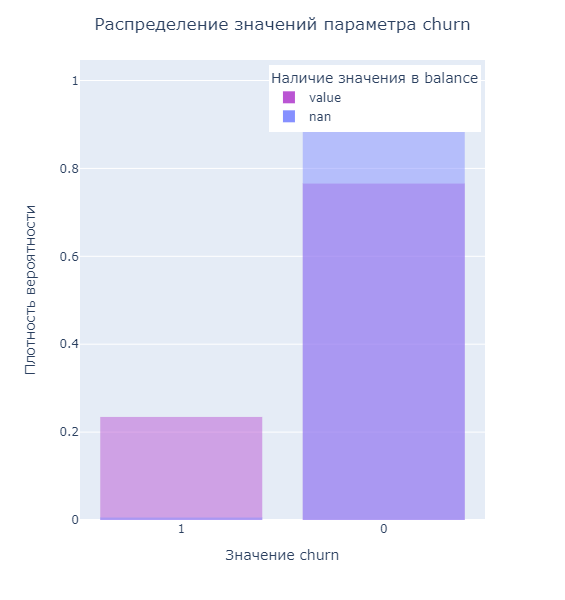

In [13]:
param_for_box = ['score', 'city', 'gender', 'age', 'equity', 'products', 
       'credit_card', 'last_activity', 'EST_SALARY', 'churn']
for param in param_for_box:
    density_hist(df_balance, 'balance', param)

Распределение значений параметров в зависимости от наличия пропусков в столбце balance:
- score: большее количество пропущенных значений встречается при значении параметра до 750 и свыше 880, гистограммы выглядят стовершенно по разному. Распределение значений при пропущенном balance выглядит не нормальным;  
- city: значительной разницы между городами нет. Немного чаще пропущенные значения в balance встречаются в Ярославле, немного реже в Ростове;  
- gender: немного чаще пропущенные значения в balance встречаются у мужчин, немного реже у женщин;  
- age: разница между распределениями не значительна;  
- equity: пропущенные значения в balance есть только у клиентов с 0 и 1 баллами собственности;  
- products: пропущенные значения в balance есть только у клиентов с 1, 2 или 3 продуктами. Большая часть пропусков при значении products = 1;  
- credit_card: пропущенных значений больше у клиентов, которые имеют кредитную карту;  
- last_activity: разница между распределениями не значительна, у активных клиентов немного больше пропусков; 
- EST_SALARY: больше пропущенных значений у клиентов с большим уровнем дохода;  
- churn: при признаке оттока 1 практически нет пропущенных значений в balance.  
  
Так как при наличии признака оттока churn = 1, пропусков в столбце balance практически нет, то отсутствие значения не повлияет на составление портрета отточного клиента и целям исследования не помешает.  
  
Оставим пропуски в столбце balance на месте.

###  Исследуем аномалии и соответствие типов.

Посмотрим на значения в столбцах, содержащих числовые данные.

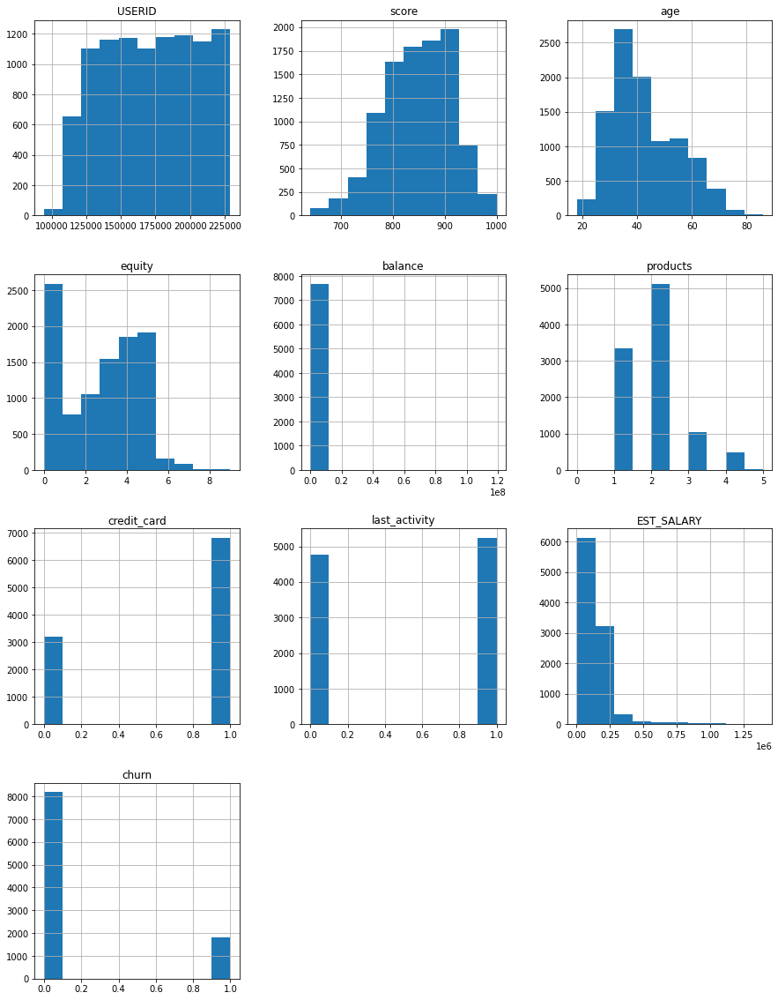

In [14]:
df.hist(figsize=(15, 20));

Распределение значений в столбцах score и age выглядит вполне нормально, никаких аномалий нет.  
В equity большое количество нулевых значений, что тоже вполне нормально.  
В balance практически все значения лежат в диапазоне до 10 000 000. При этом есть некоторое количество аномально больших значений.  
В products есть 0 значения, чего быть не может. Необходимо удалить такие строки.  
В credit_card, last_activity и churn значения 0 или 1.
В EST_SALARY практически все значения лежат в диапазоне до 750 000. При этом есть некоторое количество аномально больших значений.

Выведем количество уникальных значений в каждом столбце.

In [15]:
df.nunique()

USERID           9927
score             348
city                3
gender              2
age                68
equity             10
balance          7701
products            6
credit_card         2
last_activity       2
EST_SALARY       9996
churn               2
dtype: int64

В столбце USERID всего 9927 уникальных значений, что может указывать на наличие дубликатов в данных.  
В столбцах balance и EST_SALARY практически все значения уникальны.

Посмотрим на значения в столбцах, содержащих категориальные данные.

In [16]:
df['gender'].value_counts()

М    5005
Ж    4995
Name: gender, dtype: int64

2 значения пола, никаких аномалий нет.

In [17]:
df['city'].value_counts()

Ярославль    5888
Рыбинск      2695
Ростов       1417
Name: city, dtype: int64

3 разных города, аномалий также нет.

Посмотрим на количество строк с аномальных значением products = 0.

In [18]:
df.query('products == 0')

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
8957,147837,962.0,Рыбинск,Ж,79.0,3,NaN,0,0,0,25063.96,1


Всего одна строка. Удалим её.

In [19]:
df = df.drop(index=8957)

###  Исследуем дубликаты (полные и неполные).

In [20]:
df.duplicated().sum()

0

Полные дубликаты отсутствуют. Проверим наличие дубликатов в столбце USERID:

In [21]:
df.duplicated(subset='USERID').sum()

73

Посмотрим на строки в которых повторяются USERID. Могут ли это быть одни и теже люди.

In [22]:
user_id_dupl = df[df.duplicated(subset='USERID')]['USERID']
df.query('USERID in @user_id_dupl').sort_values(by='USERID').head(20)

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
1893,116540,883.0,Рыбинск,Ж,55.0,1,362756.49,3,0,1,175920.48,1
7694,116540,887.0,Ярославль,Ж,38.0,0,NaN,1,0,1,119247.61,0
7542,117943,880.0,Ярославль,Ж,40.0,0,NaN,1,1,0,137718.93,0
4866,117943,855.0,Рыбинск,Ж,32.0,6,1036832.93,4,1,1,107792.71,1
5896,120258,905.0,Ярославль,М,30.0,0,NaN,1,1,1,146427.96,0
5863,120258,908.0,Рыбинск,Ж,38.0,4,2213581.63,2,0,1,160327.77,1
1411,123461,829.0,Ярославль,Ж,59.0,0,96222.44,2,0,1,102771.55,1
8638,123461,934.0,Рыбинск,М,34.0,0,NaN,2,1,0,291619.27,0
8164,124450,859.0,Ярославль,Ж,38.0,6,516811.20,1,1,1,95144.63,1
9775,124450,758.0,Рыбинск,Ж,36.0,0,73574.07,2,0,1,79963.59,0


Не совпадают ни пол ни возраст. Так что это разные люди. Вероятнее всего значения USERID нигде далее не понадобятся, так что можно или заменить часть повторяющихся значений или удалить весь столбец.

###  Проверим корректность наименований колонок.

In [23]:
df.columns

Index(['USERID', 'score', 'city', 'gender', 'age', 'equity', 'balance',
       'products', 'credit_card', 'last_activity', 'EST_SALARY', 'churn'],
      dtype='object')

В колонках используются и строчные и прописные символы. Необходимо привестик строчным.

###  Переименуем колонки.

In [24]:
df = df.rename(
columns={
'USERID': 'user_id',
'EST_SALARY': 'est_salary',
}
)
df.columns

Index(['user_id', 'score', 'city', 'gender', 'age', 'equity', 'balance',
       'products', 'credit_card', 'last_activity', 'est_salary', 'churn'],
      dtype='object')

###  Удалим дубликаты.

Так как в столбце user_id есть дубликаты для различных людей удалим этот столбец

In [25]:
df = df.drop('user_id', axis=1)
df

,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
0,850.0,Рыбинск,Ж,25.0,1,59214.82,2,0,1,75719.14,1
1,861.0,Рыбинск,Ж,37.0,5,850594.33,3,1,0,86621.77,0
2,892.0,Рыбинск,Ж,30.0,0,NaN,1,1,1,107683.34,0
3,866.0,Ярославль,Ж,51.0,5,1524746.26,2,0,1,174423.53,1
4,730.0,Ярославль,М,34.0,5,174.00,1,1,0,67353.16,1
...,...,...,...,...,...,...,...,...,...,...,...
9995,814.0,Рыбинск,М,27.0,1,78144.65,1,0,1,18943.64,0
9996,894.0,Ярославль,М,46.0,0,NaN,1,1,0,196898.29,0
9997,903.0,Ярославль,М,24.0,0,NaN,2,1,1,108905.09,0
9998,777.0,Ярославль,Ж,68.0,3,865457.97,3,0,1,86874.90,0


###  Заменим пропущенные значения.

Удалим строки, содержащие пропущенные значения в столбце age.

In [26]:
df = df.dropna(subset=['age'])
df

,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
0,850.0,Рыбинск,Ж,25.0,1,59214.82,2,0,1,75719.14,1
1,861.0,Рыбинск,Ж,37.0,5,850594.33,3,1,0,86621.77,0
2,892.0,Рыбинск,Ж,30.0,0,NaN,1,1,1,107683.34,0
3,866.0,Ярославль,Ж,51.0,5,1524746.26,2,0,1,174423.53,1
4,730.0,Ярославль,М,34.0,5,174.00,1,1,0,67353.16,1
...,...,...,...,...,...,...,...,...,...,...,...
9995,814.0,Рыбинск,М,27.0,1,78144.65,1,0,1,18943.64,0
9996,894.0,Ярославль,М,46.0,0,NaN,1,1,0,196898.29,0
9997,903.0,Ярославль,М,24.0,0,NaN,2,1,1,108905.09,0
9998,777.0,Ярославль,Ж,68.0,3,865457.97,3,0,1,86874.90,0


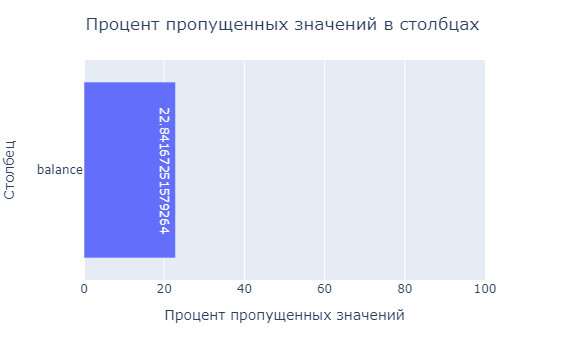

In [27]:
pass_value_barh(df)

###  Приведем типы данных.

Изменим типы данных столбцов age и score с float на int, также заменим типы int64 на int8 и int32.

In [28]:
dict_type = {
    'score' : 'int32',
    'age' : 'int8',
    'equity' : 'int8',  
    'products' : 'int8',  
    'credit_card' : 'int8',  
    'last_activity' : 'int8',  
    'churn' : 'int8',
} 
df = df.astype(dict_type)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9973 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   score          9973 non-null   int32  
 1   city           9973 non-null   object 
 2   gender         9973 non-null   object 
 3   age            9973 non-null   int8   
 4   equity         9973 non-null   int8   
 5   balance        7695 non-null   float64
 6   products       9973 non-null   int8   
 7   credit_card    9973 non-null   int8   
 8   last_activity  9973 non-null   int8   
 9   est_salary     9973 non-null   float64
 10  churn          9973 non-null   int8   
dtypes: float64(2), int32(1), int8(6), object(2)
memory usage: 487.0+ KB


In [29]:
df 

,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
0,850,Рыбинск,Ж,25,1,59214.82,2,0,1,75719.14,1
1,861,Рыбинск,Ж,37,5,850594.33,3,1,0,86621.77,0
2,892,Рыбинск,Ж,30,0,NaN,1,1,1,107683.34,0
3,866,Ярославль,Ж,51,5,1524746.26,2,0,1,174423.53,1
4,730,Ярославль,М,34,5,174.00,1,1,0,67353.16,1
...,...,...,...,...,...,...,...,...,...,...,...
9995,814,Рыбинск,М,27,1,78144.65,1,0,1,18943.64,0
9996,894,Ярославль,М,46,0,NaN,1,1,0,196898.29,0
9997,903,Ярославль,М,24,0,NaN,2,1,1,108905.09,0
9998,777,Ярославль,Ж,68,3,865457.97,3,0,1,86874.90,0


###  Добавим в таблицу новые столбцы для кодирования категориальных переменных (столбцы city и gender);

In [30]:
df['c'] = df['city']
df['g'] = df['gender']
df = pd.get_dummies(df, columns=['c','g'], prefix={'c':'city','g':'gender'}, dtype=int)
df

,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn,city_Ростов,city_Рыбинск,city_Ярославль,gender_Ж,gender_М
0,850,Рыбинск,Ж,25,1,59214.82,2,0,1,75719.14,1,0,1,0,1,0
1,861,Рыбинск,Ж,37,5,850594.33,3,1,0,86621.77,0,0,1,0,1,0
2,892,Рыбинск,Ж,30,0,NaN,1,1,1,107683.34,0,0,1,0,1,0
3,866,Ярославль,Ж,51,5,1524746.26,2,0,1,174423.53,1,0,0,1,1,0
4,730,Ярославль,М,34,5,174.00,1,1,0,67353.16,1,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,814,Рыбинск,М,27,1,78144.65,1,0,1,18943.64,0,0,1,0,0,1
9996,894,Ярославль,М,46,0,NaN,1,1,0,196898.29,0,0,0,1,0,1
9997,903,Ярославль,М,24,0,NaN,2,1,1,108905.09,0,0,0,1,0,1
9998,777,Ярославль,Ж,68,3,865457.97,3,0,1,86874.90,0,0,0,1,1,0


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9973 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   score           9973 non-null   int32  
 1   city            9973 non-null   object 
 2   gender          9973 non-null   object 
 3   age             9973 non-null   int8   
 4   equity          9973 non-null   int8   
 5   balance         7695 non-null   float64
 6   products        9973 non-null   int8   
 7   credit_card     9973 non-null   int8   
 8   last_activity   9973 non-null   int8   
 9   est_salary      9973 non-null   float64
 10  churn           9973 non-null   int8   
 11  city_Ростов     9973 non-null   int64  
 12  city_Рыбинск    9973 non-null   int64  
 13  city_Ярославль  9973 non-null   int64  
 14  gender_Ж        9973 non-null   int64  
 15  gender_М        9973 non-null   int64  
dtypes: float64(2), int32(1), int64(5), int8(6), object(2)
memory usage: 876.5+ KB


###  Вывод.

Проведена предобработка данных, установлено и проделано следующее:  
- в столбце age 0,26% пропущенных значений. Строки, содержащие пропущенные значения удалены;  
- в столбце balance 22.95% пропущенных значений. Оставлены без замены;  
- в остальных столбцах пропусков нет;  
- выявлена строка, в которой значение в столбце products равно 0. Строка удалена;  
- полных дубликатов не установлено;  
- выявлено 73 дубликата в столбце USERID. Столбец удален;  
- изменено название столбца EST_SALARY на est_salary;  
- изменены типы данных столбцов age и score с float на int, также заменены типы int64 на int8 и int32;  
- после предобработки осталось 9 973 из 10 000 строк (99.73%).
- добавлены столбцы city_Ростов, city_Рыбинск и city_Ярославль, кодирующие значения столбца city;  
- добавлены столбцы gender_Ж и gender_М, кодирующие значения столбца gender.

##  Исследовательский анализ данных.

###  Исследуем сколько всего пользователей в данных.

In [32]:
print(f'Всего в данных представлена информация о {len(df)} клиентах.')

Всего в данных представлена информация о 9973 клиентах.


###  Исследуем соотношение пользователей по признаку оттока.

In [33]:
data = df.copy()

churn_dict = {
    0 : 'остаётся',
    1 : 'уходит'
}

data['churn'] = data['churn'].map(churn_dict)

In [34]:
def pie_hist(data):
    """Визуализация распределения пользователей по признаку оттока"""
    data_pie = data.groupby('churn', as_index=False).agg({'score': 'count'})
    fig = px.pie(
        data_pie, 
        names='churn', 
        values='score',
        hole = 0.4,
        color = 'churn',
        color_discrete_map = {
            'остаётся': '#8690FF',
            'уходит': '#ACD0F4', 
    }    
    )
    
    fig.update_layout(
        title='Cоотношение клиентов по признаку оттока',
        title_x = 0.5,
        showlegend=False,
    )
    
    fig.update_traces(
        textposition='outside',
        textinfo='percent+label',
        marker=dict(line=dict(color='#000000',width=2)),
    )
    
    fig.show()

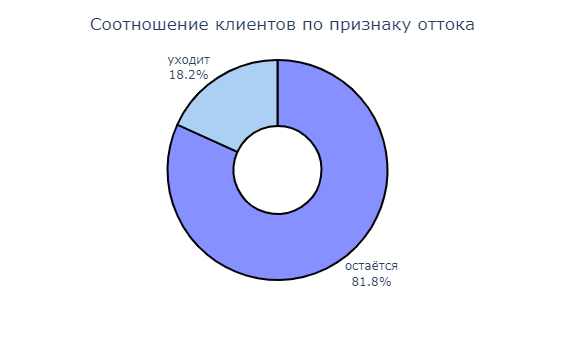

In [35]:
pie_hist(data)

1 818 клиентов планируют уйти (18.2%), 8 155 клиентов остаться (81.8%).

###  Исследуем распределение параметров в разрезе признака оттока.

Список параметров для построения гистограмм.

In [36]:
parameter_list = [
    'score', 'city', 'gender', 'age', 'equity', 'balance', 'products', 
    'credit_card', 'last_activity', 'est_salary']

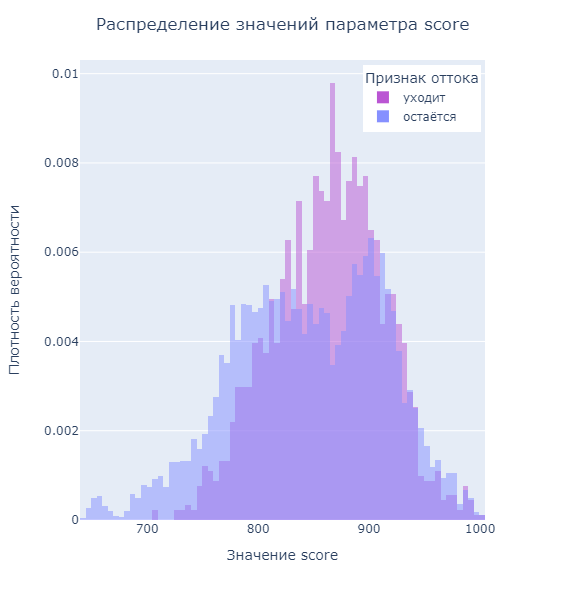

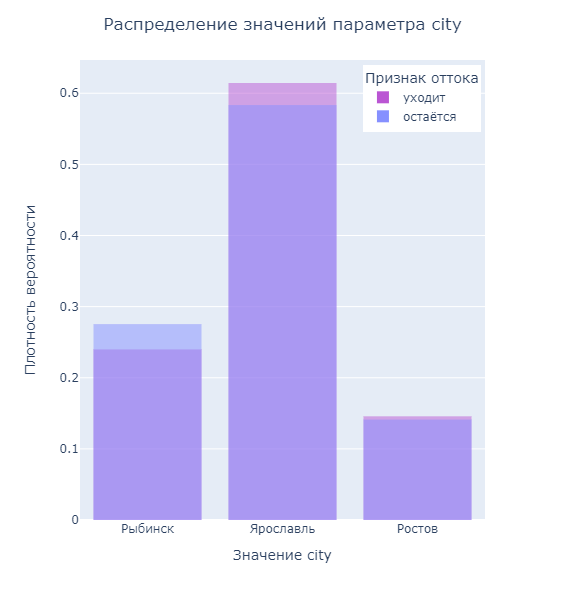

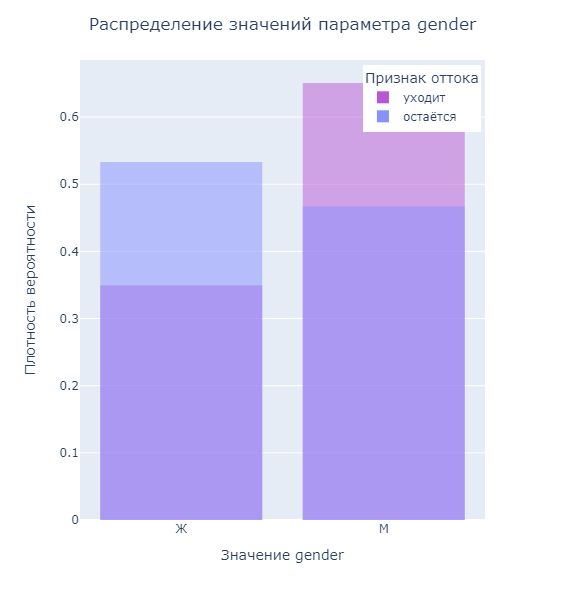

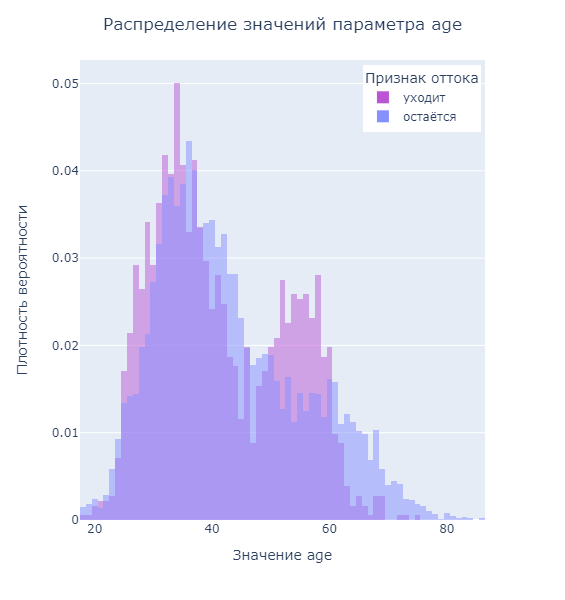

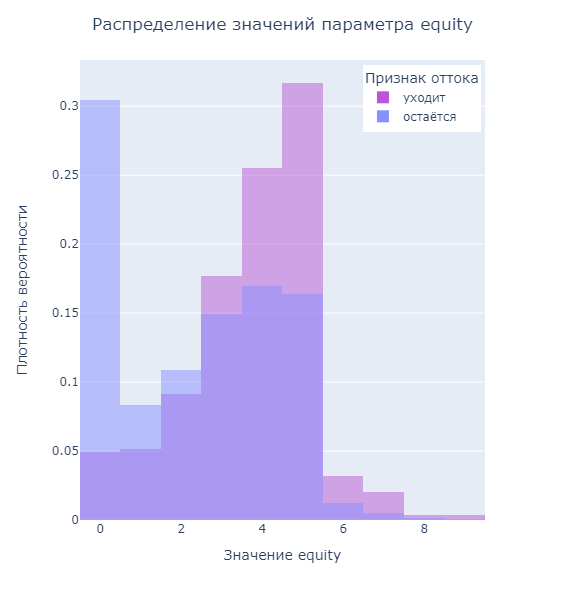

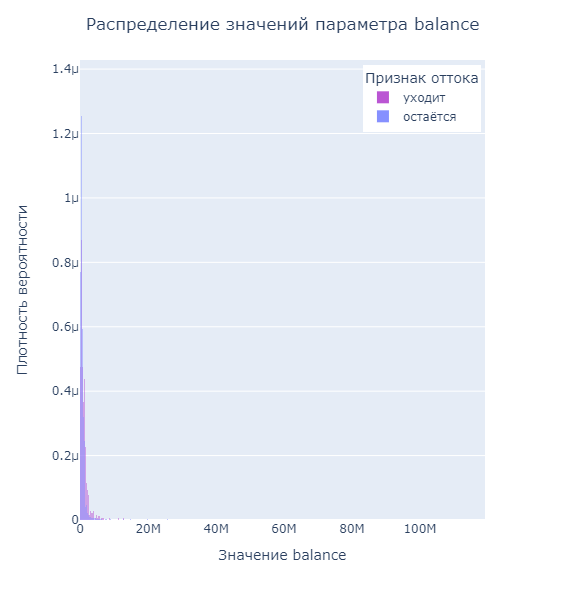

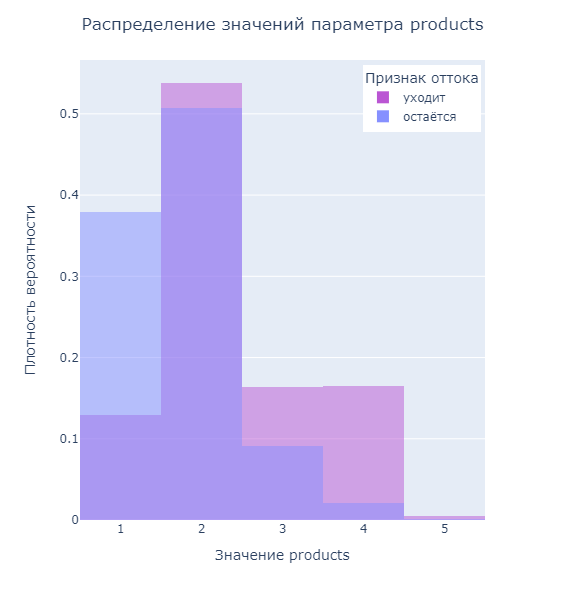

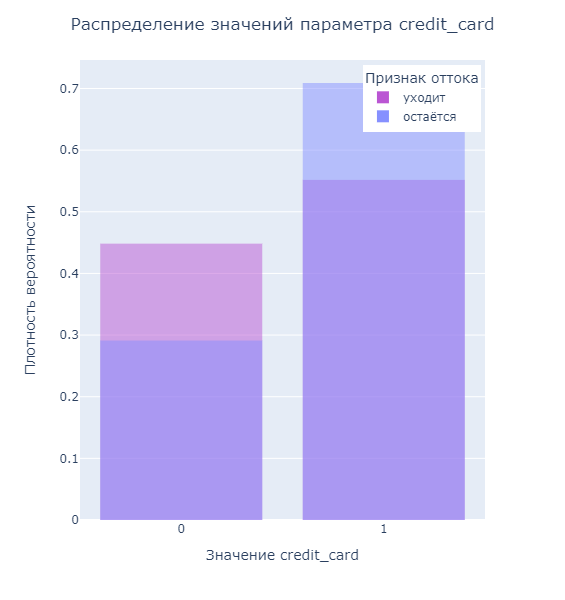

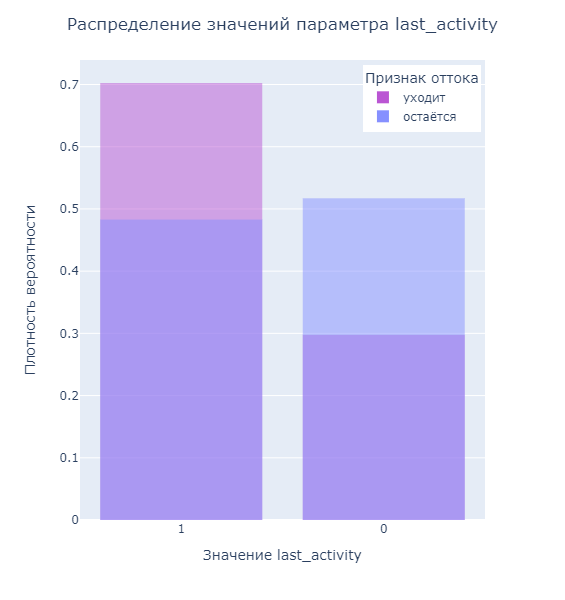

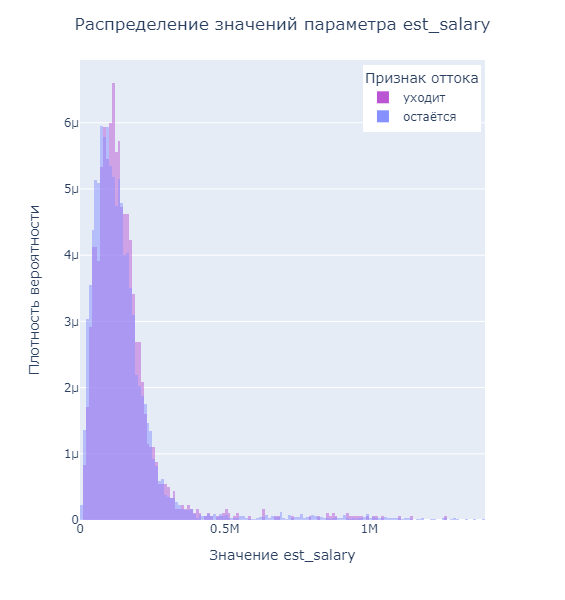

In [37]:
for p in parameter_list:
    density_hist(data, 'churn', p)

Посмотрим на гистограммы распределения значений в столбцах balance и est_salary, уменьшив диапазон значений.

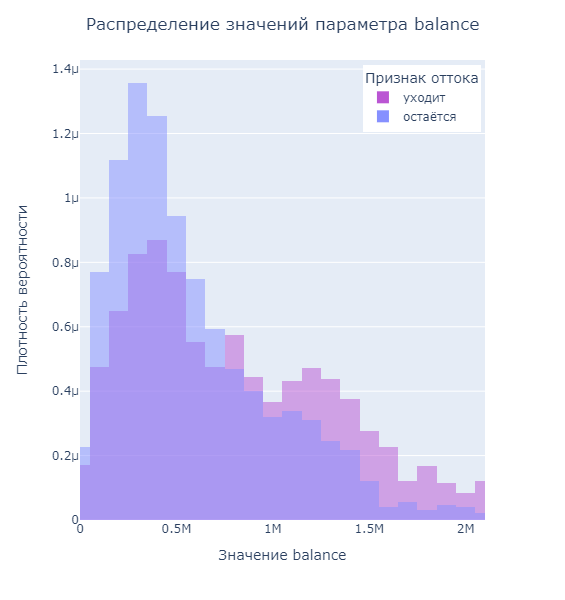

In [38]:
density_hist(data, 'churn', 'balance', range_x=[0,2100000])

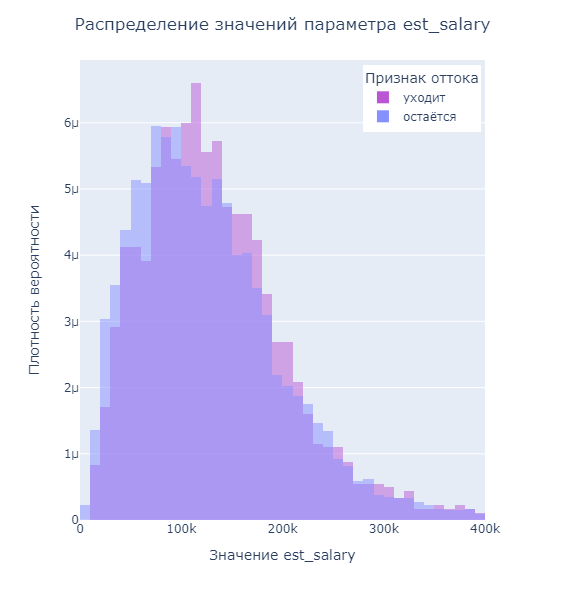

In [39]:
density_hist(data, 'churn', 'est_salary',range_x=[0,400000])

По результатам анализа распределения значений параметров у отточных неотточных клиентов разделим на категории столбцы, имеющие большое количество значений: age, est_salary, balance, score, equity и products.

###  На основании значений возраста (age), разделим пользователей на категории.

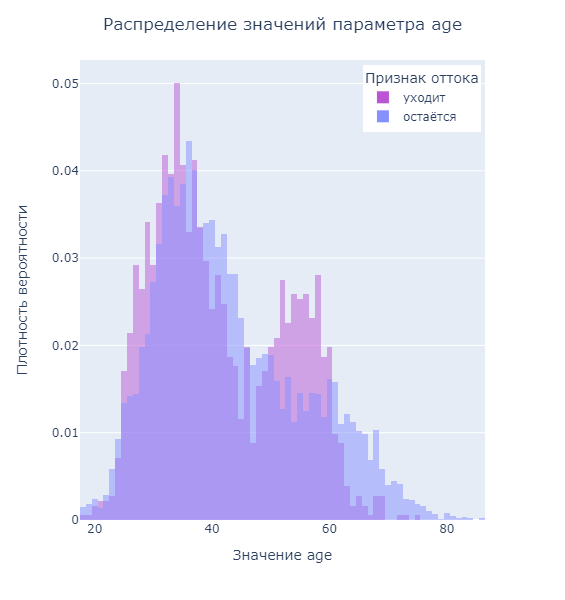

In [40]:
density_hist(data, 'churn', 'age')

На гистограмме отчетливо видно, что клиенты до 24 лет (включая 24) склонны оставаться клиентами банка, за исключением значения возраста 21 год.  
Клиенты от 25 до 35 (включая границы) чаще уходят из банка.  
Клиенты от 36 до 49 (включая границы) склонны оставаться клиентами банка, за исключением значения возраста 37 лет.  
Клиенты от 50 до 60 (включая границы) чаще уходят из банка, чем остаются.  
Клиенты старше 61 (включая 61) чаще остаются в банке, чем уходят.  
Таким образом, введем следующие категории возраста клиентов на основании распределения по признаку оттока:  
- Менее 25;
- 25-35;
- 36-49;
- 50-60;
- Более 60.

In [41]:
def categorize_age(age):
    try:
        if 25 <= age <= 35:
            return '25-35'
        elif 50 <= age <= 60:
            return '50-60'
        elif age < 25:
            return 'Менее 25'
        elif age > 60:
            return 'Более 60'
        else:
            return '36-49'
    except:
        pass

In [42]:
df['age_group'] = df['age'].apply(categorize_age)
df[['age', 'age_group']]

,age,age_group
0,25,25-35
1,37,36-49
2,30,25-35
3,51,50-60
4,34,25-35
...,...,...
9995,27,25-35
9996,46,36-49
9997,24,Менее 25
9998,68,Более 60


###  На основании значений дохода (est_salary), разделим пользователей на категории.

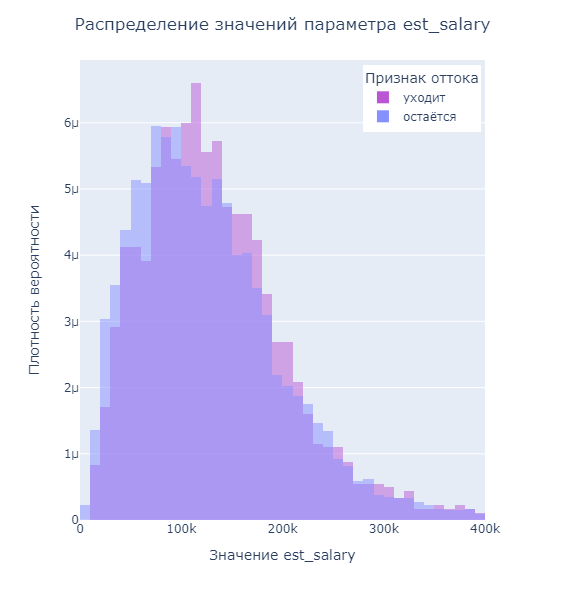

In [43]:
density_hist(data, 'churn', 'est_salary',range_x=[0,400000])

На гистограмме отчетливо видно, что клиенты с уровнем дохода менее 100 000 склонны оставаться клиентами банка (за исключением промежутка 80 000 - 90 000).  
Клиенты с уровнем дохода 100 000 - 220 000 чаще уходят из банка.  
Клиенты с уровнем дохода более 220 000 различий по признаку оттока практически не имеют.  

Таким образом, введем следующие категории дохода клиентов на основании распределения по признаку оттока:  
- Менее 100 000;
- От 100 000 до 220 000;
- Более 220 000.

In [44]:
def categorize_salary(salary):
    try:
        if 100000 <= salary <= 220000:
            return 'От 100 000 до 220 000'
        elif salary < 100000:
            return 'Менее 100 000'
        else:
            return 'Более 220 000'
    except:
        pass

In [45]:
df['salary_group'] = df['est_salary'].apply(categorize_salary)
df[['est_salary', 'salary_group']]

,est_salary,salary_group
0,75719.14,Менее 100 000
1,86621.77,Менее 100 000
2,107683.34,От 100 000 до 220 000
3,174423.53,От 100 000 до 220 000
4,67353.16,Менее 100 000
...,...,...
9995,18943.64,Менее 100 000
9996,196898.29,От 100 000 до 220 000
9997,108905.09,От 100 000 до 220 000
9998,86874.90,Менее 100 000


###  На основании значений баланса (balance), разделим пользователей на категории.

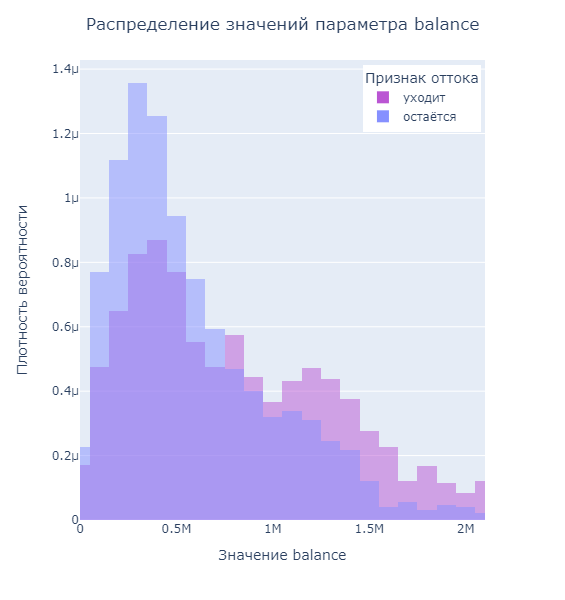

In [46]:
density_hist(data, 'churn', 'balance', range_x=[0,2100000])

На гистограмме отчетливо видно, что клиенты со значением баланса менее 750 000 склонны оставаться клиентами банка.
Клиенты со значением баланса более 750 000 чаще уходят из банка.
  
Таким образом, введем следующие категории баланса клиентов на основании распределения по признаку оттока:
- Менее 750 000;
- Более 750 000;
- Нет данных (для клиентов значение баланса, которых в данных пропущено).

In [47]:
def categorize_balance(balance):
    try:
        if balance < 750000:
            return 'Менее 750 000'
        elif balance >= 750000:
            return 'Более 750 000'
        else:
            return 'Нет данных'
    except:
        pass

In [48]:
df['balance_group'] = df['balance'].apply(categorize_balance)
df[['balance', 'balance_group']]

,balance,balance_group
0,59214.82,Менее 750 000
1,850594.33,Более 750 000
2,NaN,Нет данных
3,1524746.26,Более 750 000
4,174.00,Менее 750 000
...,...,...
9995,78144.65,Менее 750 000
9996,NaN,Нет данных
9997,NaN,Нет данных
9998,865457.97,Более 750 000


###  На основании значений баллов кредитного скоринга (score), разделим пользователей на категории.

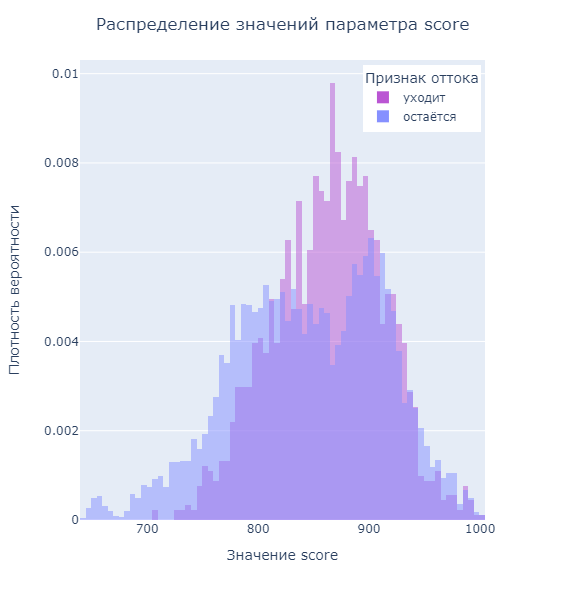

In [49]:
density_hist(data, 'churn', 'score')

На гистограмме отчетливо видно, что клиенты со значением баллов кредитного скоринга менее 820 склонны оставаться клиентами банка.  
Клиенты со значением баллов кредитного скоринга от 820 до 910 чаще уходят из банка (за исключением диапазона 830-834).  
Клиенты со значением баллов кредитного скоринга более 910 ведут себя практически одинаково.  
  
Таким образом, введем следующие категории баллов кредитного скоринга на основании распределения по признаку оттока:
- Менее 820;
- От 820 до 910;
- Более 910.

In [50]:
def categorize_score(score):
    try:
        if 820 <= score <= 910:
            return 'От 820 до 910'
        elif score < 820:
            return 'Менее 820'
        else:
            return 'Более 910'
    except:
        pass

In [51]:
df['score_group'] = df['score'].apply(categorize_score)
df[['score', 'score_group']]

,score,score_group
0,850,От 820 до 910
1,861,От 820 до 910
2,892,От 820 до 910
3,866,От 820 до 910
4,730,Менее 820
...,...,...
9995,814,Менее 820
9996,894,От 820 до 910
9997,903,От 820 до 910
9998,777,Менее 820


###  На основании значений баллов собственности (equity), разделим пользователей на категории.

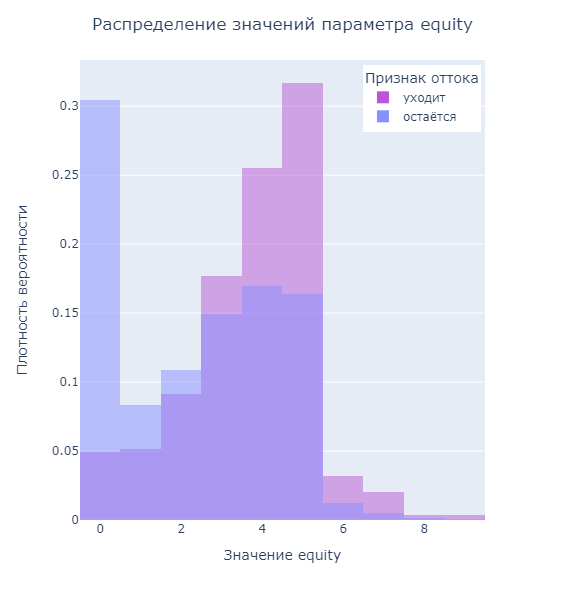

In [52]:
density_hist(data, 'churn', 'equity')

На гистограмме отчетливо видно, что клиенты со значением баллов собственности 2 и меньше склонны оставаться клиентами банка.  
Клиенты со значением баллов собственности более 3 (включая 3) чаще уходят из банка.   
  
Таким образом, введем следующие категории баллов собственности на основании распределения по признаку оттока:
- Менее 3;
- 3 и более.

In [53]:
def categorize_equity(equity):
    try:
        if equity >= 3:
            return '3 и более'
        else:
            return 'Менее 3'
    except:
        pass

In [54]:
df['equity_group'] = df['equity'].apply(categorize_equity)
df[['equity', 'equity_group']]

,equity,equity_group
0,1,Менее 3
1,5,3 и более
2,0,Менее 3
3,5,3 и более
4,5,3 и более
...,...,...
9995,1,Менее 3
9996,0,Менее 3
9997,0,Менее 3
9998,3,3 и более


###  На основании значений количества продуктов (products), разделим пользователей на категории.

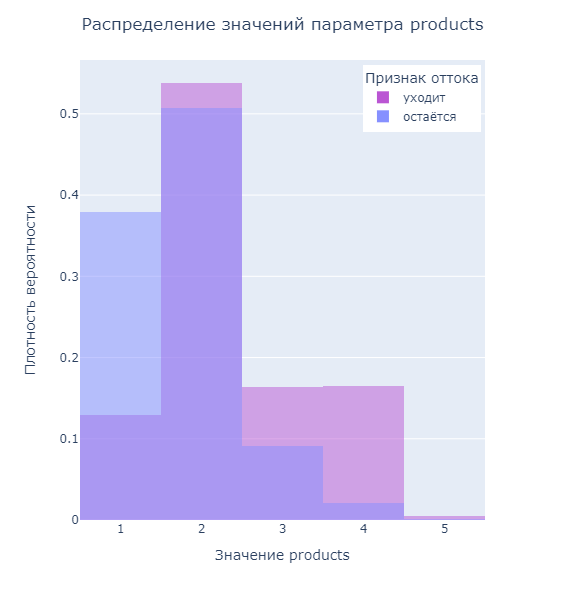

In [55]:
density_hist(data, 'churn', 'products')

На гистограмме отчетливо видно, что клиенты со значением количества продуктов 1 склонны оставаться клиентами банка.  
Клиенты со значением количества продуктов 2 занимают самую большую часть и их поведение различается не значительно;  
Клиенты со значением количества продуктов более 3 (включая 3) чаще уходят из банка.   
  
Таким образом, введем следующие категории количества продуктов на основании распределения по признаку оттока:
- Один;  
- Два;
- Более двух.

In [56]:
def categorize_products(products):
    try:
        if products == 1:
            return 'Один'
        elif products == 2:
            return 'Два'
        else:
            return 'Более двух'
    except:
        pass

In [57]:
df['product_group'] = df['products'].apply(categorize_products)
df[['products', 'product_group']]

,products,product_group
0,2,Два
1,3,Более двух
2,1,Один
3,2,Два
4,1,Один
...,...,...
9995,1,Один
9996,1,Один
9997,2,Два
9998,3,Более двух


Построим гистограммы распределения плотности вероятности значений новых групп.

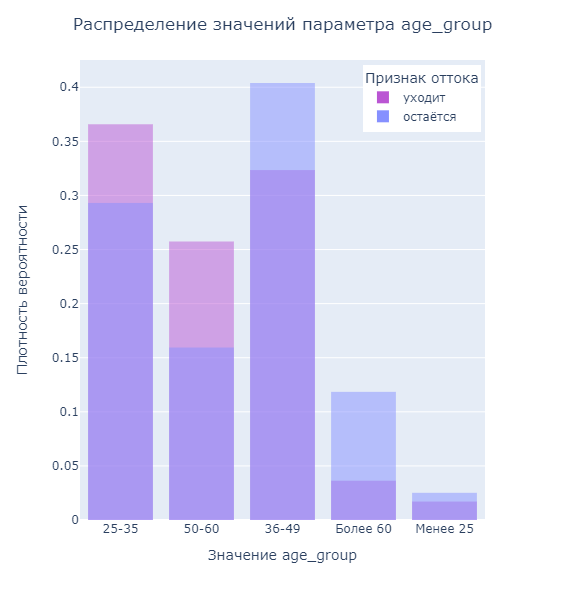

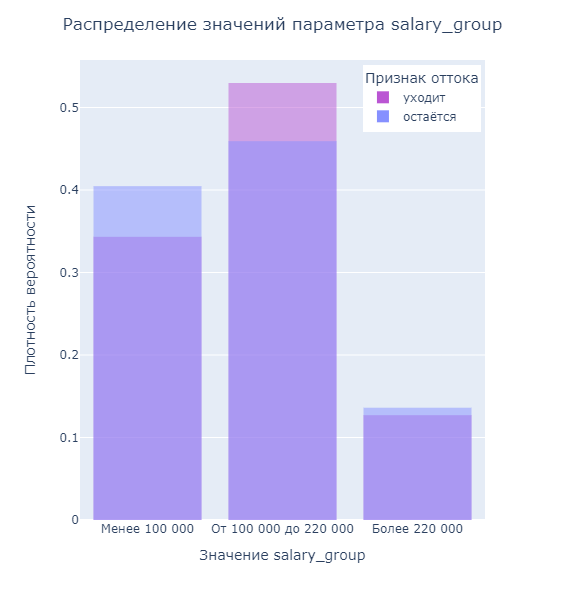

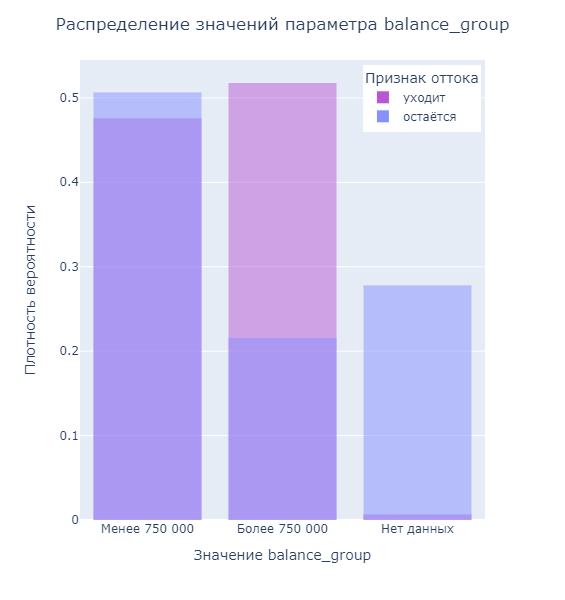

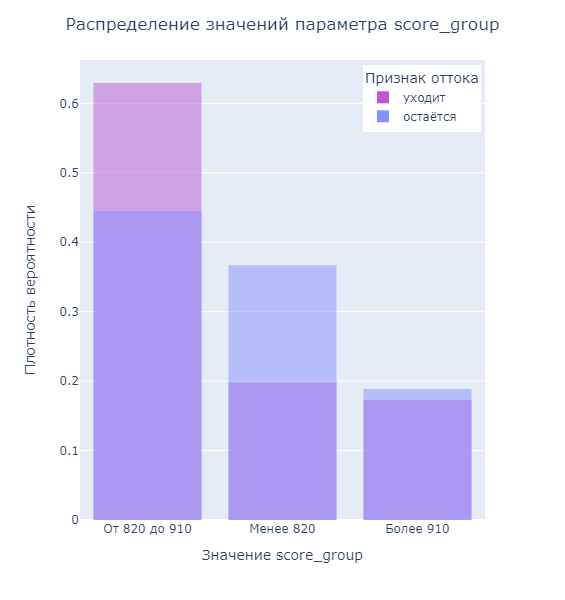

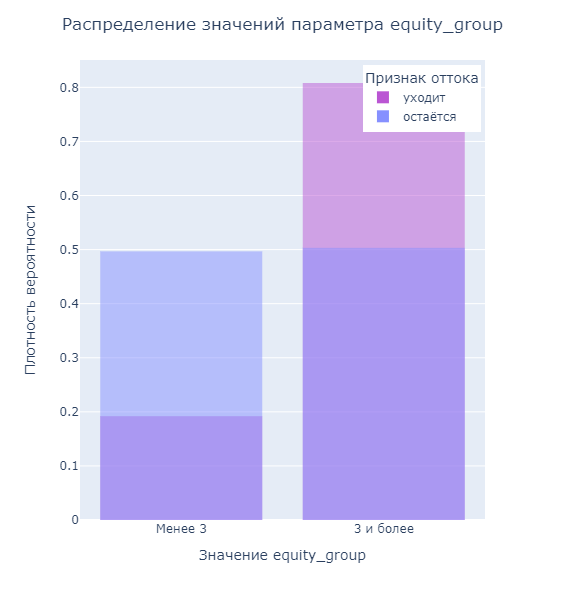

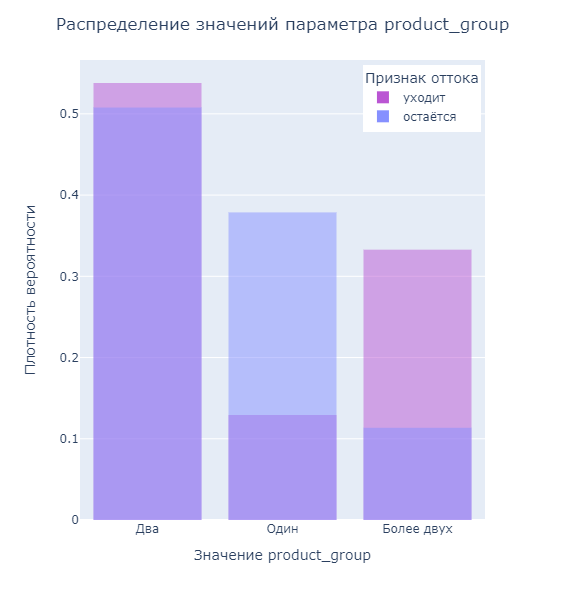

In [58]:
data = df.copy()
data['churn'] = data['churn'].map(churn_dict)
add_p = ['age_group', 'salary_group', 'balance_group', 'score_group', 'equity_group', 'product_group']
for p in add_p:
    density_hist(data, 'churn', p)

###  Выявим какие параметры, которые больше всего влияют на признак оттока.

Построим матрицу корреляции.

In [59]:
def create_heatmap(df_corr, height=600):
    """Функция для построения визуализации матрицы корреляции (heatmap).
    Принимает матрицу корреляции и значение параметра высоты визуализации (height) в пикселях.
    По умолчанию установлено значение 600px"""
    fig = ff.create_annotated_heatmap(
        x = list(df_corr.columns),
        y = list(df_corr.index),
        z = df_corr.values,
        annotation_text = np.around(df_corr.values, decimals=3),
        hoverinfo='x,y,z',
        colorscale='bupu',
        showscale=True
        )
    fig.update_layout(height=height)
    fig.show()

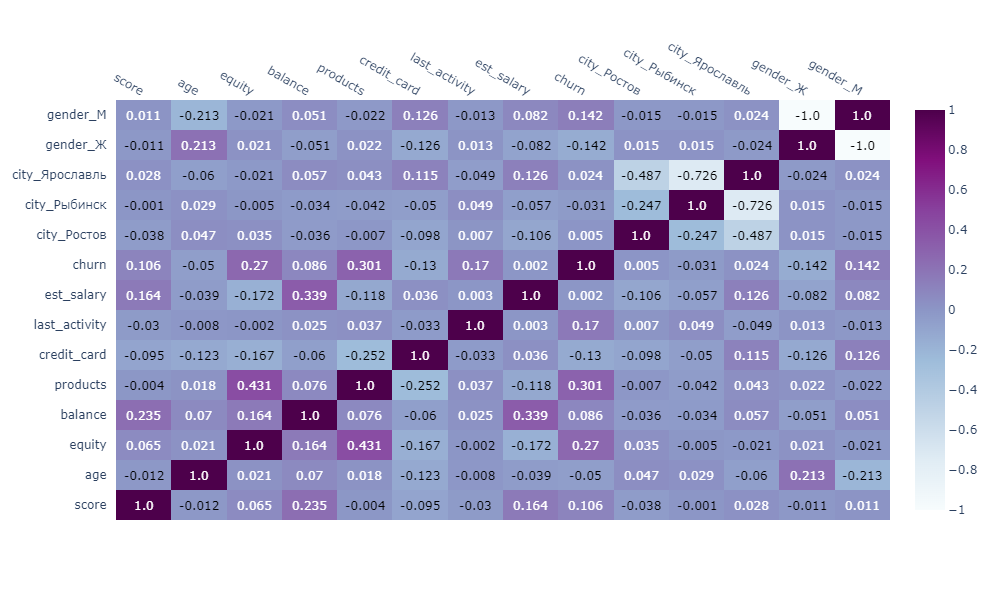

In [60]:
create_heatmap(df.corr())

Выделим строку с параметром churn.

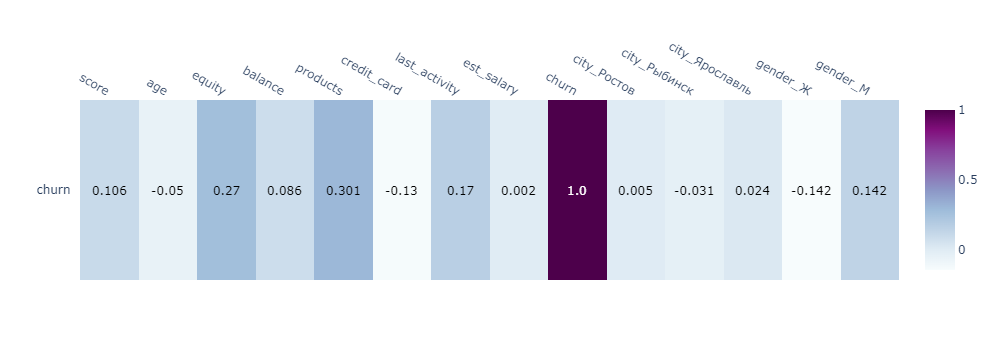

In [61]:
create_heatmap(df.corr()[:'churn']['churn':], height=300)

In [62]:
print('Распределение параметров, влияющих на признак оттока, \
в порядке убывания значения коэффициента корреляции:\n',
df.corr()['churn'].sort_values(ascending=False, key=abs)[1:])

Распределение параметров, влияющих на признак оттока, в порядке убывания значения коэффициента корреляции:
 products          0.301274
equity            0.270105
last_activity     0.169690
gender_М          0.141896
gender_Ж         -0.141896
credit_card      -0.130122
score             0.106076
balance           0.085915
age              -0.050463
city_Рыбинск     -0.030989
city_Ярославль    0.024300
city_Ростов       0.005115
est_salary        0.001893
Name: churn, dtype: float64


Наибольшая корреляция признака оттока клиентов установлена с параметрами:
1) products  
2) equity  
3) last_activity  
4) gender  
5) credit_card  
  
  
Наименьшая корреляция признака оттока клиентов установлена с параметрами:
1) est_salary  
2) city  
3) age  
4) balance  
5) score

###  Определим все значимые признаки отточности (интервалы значений параметров, которые связаны с повышенным оттоком).

Для параметров установлены значения:  
- score: уходят со значением параметра 820-910, с меньшим значением остаются, с большим почти одинаково;  
- city: уходят Ярославль, остаются Рыбинск, Ростов почти одинаково;  
- gender: уходят М, остаются Ж;  
- age: уходят 25-35  и  50-60, остальные остаются;  
- equity: 3 и больше - уходят, 0-2 остаются;  
- balance: до 750 000 остаются, после 750 000 уходят;  
- products: 3-5 уходят, 1 остаются, 2 почти одинаково;  
- credit_card: 0 - уходят, 1 - остаются;  
- last_activity: 1 - уходят, 0 - остаются;  
- est_salary: 100 000 - 220 000 - уходят, до 100 000 остаются, более 220 000 одинаково.
  
Наиболее важными являются параметры products, equity, last_activity, gender, credit_card и score.

###  Сравним портреты типичных клиентов, которые склонны и не склонны уходить из банка.

Склонны уходить из банка клиенты у которых:
- более 3 продуктов;  
- количество баллов собственности больше или равно 3;  
- признак активности - 1;  
- пол - М;  
- нет кредитной карты;  
- баллов кредитного скоринга 820-910;  
- баланс свыше 750 000;  
- возраст 25-35 и 50-60;  
- город Ярославль;
- доход 100 000 - 220 000.  
  
Склонны оставаться клиентами банка клиенты у которых:
- 1 продукт;  
- количество баллов собственности меньше или равно 2;  
- признак активности - 0;  
- пол - Ж;  
- есть кредитная карта;  
- баллов кредитного скоринга меньше 820;  
- балланс ниже 750 000 (а также клиенты у которых нет данных о балансе);  
- возраст ниже 25, 36-49 и старше 60;  
- город Рыбинск;
- доход ниже 100 000.  
  

###  Вывод.
Наибольшая корреляция признака оттока клиентов установлена с параметрами:
1) products (3-5 уходят, 1 остаются, 2 почти одинаково)  
2) equity (3 и больше - уходят, 0-2 остаются)  
3) last_activity (1 - уходят, 0 - остаются)  
4) gender (уходят М, остаются Ж)  
5) credit_card (0 - уходят, 1 - остаются)  
6) score  (уходят со значением параметра 820-910, с меньшим значением остаются, с большим почти одинаково)  
  
Наименьшая корреляция признака оттока клиентов установлена с параметрами:
1) est_salary (100 000 - 220 000 - уходят, до 100 000 остаются, более 220 000 одинаково)  
2) city (уходят Ярославль, остаются Рыбинск, Ростов почти одинаково)  
3) user_id  
4) age (уходят 25-35  и  50-60, остальные остаются)  
5) balance (до 750 000 остаются, после 750 000 уходят)  

##  Сформулируем и проверим статистические гипотезы.

###  Проверим гипотезу различия дохода между теми клиентами, которые ушли и теми, которые остались.

Сформулируем нулевую и альтернативную гипотезы:  
$H_0$ Средние уровни дохода клиентов, которые ушли и клиентов, которые остались равны  
$H_1$ Средние уровни дохода клиентов, которые ушли и клиентов, которые остались не равны  
  
Для проверки гипотезы используем метод st.ttest_ind (метод для проверки гипотезы о равенстве среднего двух генеральных совокупностей по взятым из них выборкам). Уровень статистической значимости установим 1%

In [63]:
salary_churn_0 = df.query('churn == 0')['est_salary']
salary_churn_1 = df.query('churn == 1')['est_salary']
alpha = 0.01 
results = stats.ttest_ind(salary_churn_0, salary_churn_1)
print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение: 0.8500882387258035
Не получилось отвергнуть нулевую гипотезу


Таким образом, установлено, что различие групп клиентов, которые уходят и которые остаются по признаку дохода не является статистически значимым.

###  Проверим гипотезу различия среднего возраста между теми клиентами, которые ушли и теми, которые остались.

Сформулируем нулевую и альтернативную гипотезы:  
$H_0$ Средний возраст клиентов, которые ушли и клиентов, которые остались равен  
$H_1$ Средний возраст клиентов, которые ушли и клиентов, которые остались не равен  
  
Для проверки гипотезы используем метод st.ttest_ind (метод для проверки гипотезы о равенстве среднего двух генеральных совокупностей по взятым из них выборкам). Уровень статистической значимости установим 1%

In [64]:
age_churn_0 = df.query('churn == 0')['age']
age_churn_1 = df.query('churn == 1')['age']
alpha = 0.01 
results = stats.ttest_ind(age_churn_0, age_churn_1)
print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение: 4.606448303493975e-07
Отвергаем нулевую гипотезу


Таким образом, установлено, что различие групп клиентов, которые уходят и которые остаются по признаку возраста является статистически значимым.

### Вывод.  
Проведены проверки гипотез о равенстве средних двух генеральных совокупностей.  
- различие групп клиентов, которые уходят и которые остаются по признаку дохода не является статистически значимым;  
- различие групп клиентов, которые уходят и которые остаются по признаку возраста является статистически значимым.

##  Сформируем сегменты пользователей и отберем из них лучшие.

###  Определим сегменты отточных пользователей на основании комбинации параметров.

Выберем комбинации из пяти различных параметров и посчитаем для них процент отточных пользователей и общее количество пользователей.

In [65]:
#столбцы по которым будем составлять комбинации
columns = ['city', 'gender', 'credit_card', 'last_activity',
           'age_group', 'salary_group',
           'balance_group', 'score_group', 'equity_group',
           'product_group']

combs = combinations(columns, 3)

dataframe = [] #список в который соберем значения для каждой комбинации
for comb in combs:
    a = df[comb[0]].unique()
    b = df[comb[1]].unique()
    c = df[comb[2]].unique()

    s = product(a, b, c)

    for ss0, ss1, ss2 in s:
        q = f'{comb[0]} == {ss0!r} & {comb[1]} == {ss1!r} & {comb[2]} == {ss2!r}'
        qq = df.query(q)['churn']
        dataframe.append([q, qq.mean(), len(qq)])

Соберем все комбинации параметров (segment), значения процента отточных пользователей (churn_per), общее количество пользователей в сегменте (total) и количество отточных пользователей (best) в датафрейм segments.  
Отфильтруем датафрейм по значению параметра churn_per, чтобы он был строго больше чем процент отточных пользователей по всем данным (total_churn).  
Сегменты отсортируем по общему количеству отточных пользователей (best) в порядке убывания.

In [66]:
pd.options.display.max_colwidth = 160
segments = pd.DataFrame(dataframe, columns=['segment','churn_per','total'])
segments['best'] = segments['churn_per'] * segments['total']
total_churn = df['churn'].mean()
segments = segments.sort_values(by='best', ascending=False)
segments

,segment,churn_per,total,best
1905,last_activity == 1 & score_group == 'От 820 до 910' & equity_group == '3 и более',0.461348,1617,746.0
353,city == 'Ярославль' & last_activity == 1 & equity_group == '3 и более',0.409877,1620,664.0
967,gender == 'М' & last_activity == 1 & equity_group == '3 и более',0.461648,1408,650.0
1877,last_activity == 1 & balance_group == 'Более 750 000' & equity_group == '3 и более',0.499226,1292,645.0
1243,gender == 'М' & score_group == 'От 820 до 910' & equity_group == '3 и более',0.409001,1511,618.0
...,...,...,...,...
2486,balance_group == 'Нет данных' & score_group == 'Менее 820' & equity_group == '3 и более',NaN,0,NaN
2488,balance_group == 'Нет данных' & score_group == 'Более 910' & equity_group == '3 и более',NaN,0,NaN
2531,balance_group == 'Нет данных' & equity_group == '3 и более' & product_group == 'Два',NaN,0,NaN
2532,balance_group == 'Нет данных' & equity_group == '3 и более' & product_group == 'Более двух',NaN,0,NaN


Всего получилось 2552 различных сегмента, основанных на 3 параметрах.  
Отберем из них сегменты, которые удовлетворяют условию превышения процента отточных пользователей над 30%.

In [67]:
best_seg = segments.query('churn_per > 0.3').reset_index(drop=True)
best_seg

,segment,churn_per,total,best
0,last_activity == 1 & score_group == 'От 820 до 910' & equity_group == '3 и более',0.461348,1617,746.0
1,city == 'Ярославль' & last_activity == 1 & equity_group == '3 и более',0.409877,1620,664.0
2,gender == 'М' & last_activity == 1 & equity_group == '3 и более',0.461648,1408,650.0
3,last_activity == 1 & balance_group == 'Более 750 000' & equity_group == '3 и более',0.499226,1292,645.0
4,gender == 'М' & score_group == 'От 820 до 910' & equity_group == '3 и более',0.409001,1511,618.0
...,...,...,...,...
467,age_group == 'Менее 25' & salary_group == 'Более 220 000' & balance_group == 'Более 750 000',0.400000,5,2.0
468,credit_card == 0 & age_group == 'Менее 25' & salary_group == 'Более 220 000',0.333333,6,2.0
469,age_group == 'Менее 25' & balance_group == 'Нет данных' & product_group == 'Более двух',1.000000,1,1.0
470,city == 'Рыбинск' & age_group == 'Менее 25' & product_group == 'Более двух',0.500000,2,1.0


Осталось всего 472 сегмента. Отберем из них сегменты, признаки в которых не пересекаются.

In [68]:
top_best_seg = best_seg[:1]
used_signs = set(best_seg.loc[0]['segment'].split(' & '))

i = 0
for index in best_seg.index:
    sign = set(best_seg.loc[index]['segment'].split(' & '))
   
    if len(sign & used_signs) == 0:
        used_signs |= sign
        top_best_seg = top_best_seg.append(best_seg.loc[index], ignore_index = True)
            
top_best_seg

,segment,churn_per,total,best
0,last_activity == 1 & score_group == 'От 820 до 910' & equity_group == '3 и более',0.461348,1617,746.0
1,city == 'Ярославль' & gender == 'М' & balance_group == 'Более 750 000',0.480565,849,408.0
2,credit_card == 0 & salary_group == 'От 100 000 до 220 000' & product_group == 'Два',0.331118,903,299.0
3,credit_card == 1 & age_group == '36-49' & product_group == 'Более двух',0.525735,272,143.0
4,city == 'Рыбинск' & age_group == 'Менее 25' & salary_group == 'Более 220 000',1.000000,1,1.0


Осталось всего 5 сегментов. Лучшими посчитаем первые 3.

###  Построим визуализации по сегментам.

Для 3 лучших сегментов (best_segments) построим визуализации процента отточных пользователей. Сравним с процентом отточных пользователей полных данных.

In [69]:
best_segments = top_best_seg.head(3)['segment']
best_segments

0      last_activity == 1 & score_group == 'От 820 до 910' & equity_group == '3 и более'
1                 city == 'Ярославль' & gender == 'М' & balance_group == 'Более 750 000'
2    credit_card == 0 & salary_group == 'От 100 000 до 220 000' & product_group == 'Два'
Name: segment, dtype: object

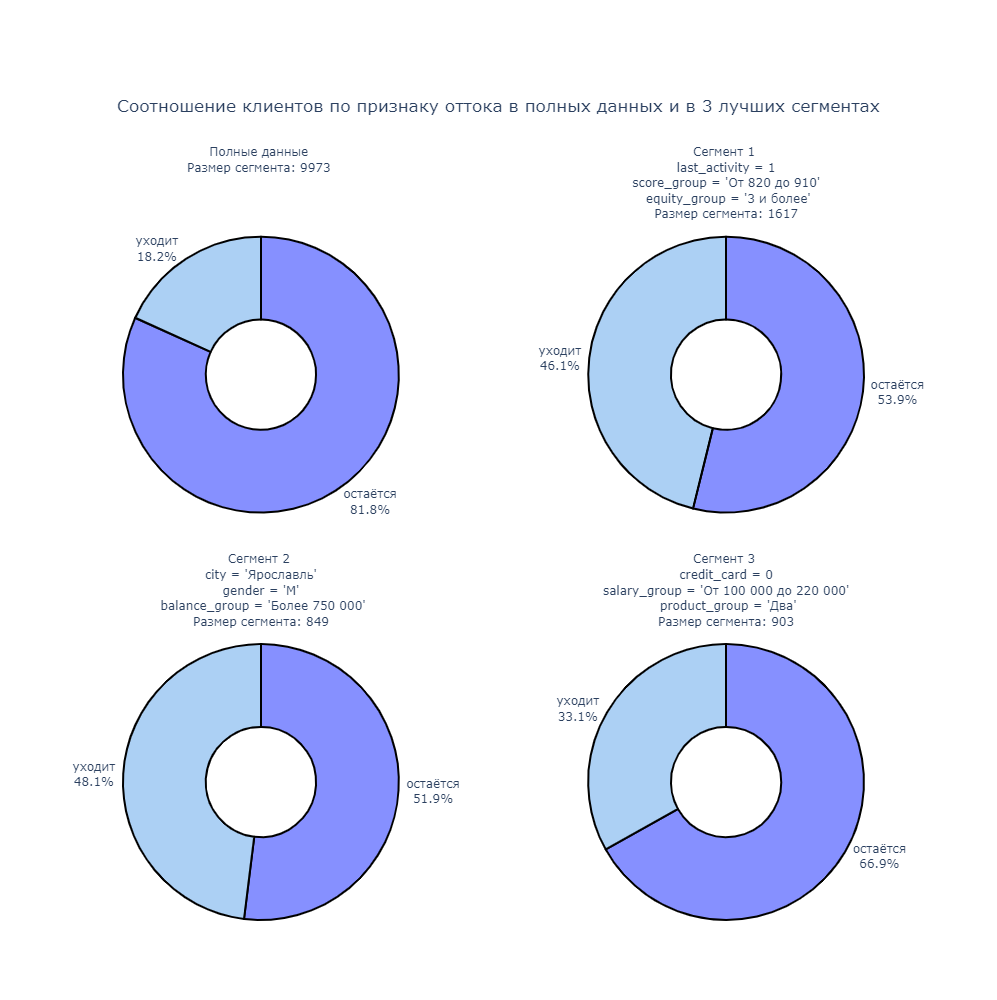

In [70]:
sp = make_subplots(rows=2, cols=2,
    specs=[
        [{'type': 'domain'}, {'type': 'domain'}], 
        [{'type': 'domain',}, {'type': 'domain',}],
    ],
    horizontal_spacing=0.15,
    vertical_spacing=0.05
)

colors = {
    'остаётся': '#8690FF',
    'уходит': '#ACD0F4', 
}

for i in range(len(best_segments)+1):
    if i == 0:
        data = df.copy()
        title = 'Полные данные'
    else:
        data = df.query(best_segments[i - 1])
        title = best_segments[i - 1]

    data['churn'] = data['churn'].map(churn_dict)
    data_pie = data.groupby('churn', as_index=False).agg({'score': 'count'})
    pie = go.Pie( 
        labels=data_pie['churn'], 
        values=data_pie['score'],
        hole = 0.4,
        marker={'colors': pd.Series(colors), 'line': dict(color='#000000',width=2)},
        textposition='outside',
        textinfo='percent+label',
        showlegend=False,
 #       scalegroup='one',
    )
    if i == 0:
        pie.title.text = f'{title} <br>Размер сегмента: {len(data)} <br> <br> <br> <br> <br>'
        pie.title.position = 'top center'
    else:
        pie.title.text = (f'Сегмент {i} <br> {title.replace("&", "<br>").replace("==",  "=")}'
                          f'<br> Размер сегмента: {len(data)} <br> <br>')
        pie.title.position = 'top center'
    
    sp.add_trace(pie, row=i//2 + 1, col=i%2 + 1)
    
sp.update_layout(
    height= 1000, 
    title='Cоотношение клиентов по признаку оттока в полных данных и в 3 лучших сегментах', 
    title_y=0.9, 
    title_x=0.5
)
sp.show()

###  Рекомендации для каждого сегмента.

### По результатам проведенного исследования выделены 3 лучших сегмента пользователей:  
1) Всего в сегменте 1617 пользователей. Процент оттока - 46%.  
Признаки сегмента:  
- активный клиент (last_activity = 1);  
- баллов кредитного скоринга от 820 до 910 (820 <= score <= 910);  
- количество баллов собственности 3 или более (equity >= 3).  
  
2) Всего в сегменте 849 пользователей. Процент оттока - 48%.  
Признаки сегмента:  
- город Ярославль (city = Ярославль);  
- мужчина (gender = М);
- баланс на счете более 750 000 (balance >= 750 000).  
  
3) Всего в сегменте 903 пользователя. Процент оттока - 33%.  
Признаки сегмента:  
- нет кредитной карты (credit_card = 0);
- оценочный доход клиента от 100 000 до 220 000 (100 000 <= est_salary <= 220 000);
- пользуется 2 продуктами (products = 2).

На основании признаков, можно сделать следующие рекомендации по каждому сегменту:  
1) Можно сделать предположение, что уходят в основном обеспеченные клиенты с высокими баллами кредитного скоринга, которые недавно пытались совершить какое либо действие в банке. Вероятно у клиентов возникли проблемы при совершении этого действия (ошибка в приложении или проблемы с персоналом банка). А так как эти клиенты с большими баллами кредитного скоринга и собственности, то им будут рады в любом другом банке. Таким образом, следует проанализировать работу приложения, службы поддержки и сотрудников банка.  
2) Предложить мужчинам Ярославля повышенный процент по остатку на счете (либо по вкладу) свыше 750 000 руб.  
3) Предложить кредитную карту на более выгодных условиях, чем у конкурентов (сниженная процентная ставка, больший кредитный лимит или более длинный льготный период).  

##  Презентация.

[Презентация](https://drive.google.com/file/d/1Tp2NsKkXHHMKLFsGWm3kZe0KqMRvAQCr/view?usp=drive_link)

##  Общий вывод.

На основании данных о клиентах банка из трех городов:  Ярославля, Ростова Великого и Рыбинска проведен анализ, по результатам которого выделены сегменты клиентов, которые склонны уходить из банка. На основании отобранных сегментов, менеджерами банка будут приняты целевые меры по удержанию отточных клиентов.  

- всего в данных 12 столбцов и 10000 строк:  
USERID — идентификатор пользователя,  
score — баллы кредитного скоринга,  
city — город,  
gender — пол,  
age — возраст,  
equity — количество баллов собственности,  
balance — баланс на счёте,  
products — количество продуктов, которыми пользуется клиент,  
credit_card — есть ли кредитная карта,  
last_activity — активный клиент,  
EST_SALARY — оценочный доход клиента,  
сhurn — признак оттока.

Проведена предобработка данных, установлено и проделано следующее:  
- в столбце age 0,26% пропущенных значений. Строки, содержащие пропущенные значения удалены;  
- в столбце balance 22.95% пропущенных значений. Оставлены без замены;  
- в остальных столбцах пропусков нет;  
- выявлена строка, в которой значение в столбце products равно 0. Строка удалена;  
- полных дубликатов не установлено;  
- выявлено 73 дубликата в столбце USERID. Столбец USERID удален;  
- изменено название столбца EST_SALARY на est_salary;  
- изменены типы данных столбцов age и score с float на int, также заменены типы int64 на int8 и int32;  
- после предобработки осталось 9 973 из 10 000 строк (99.73%).  

Добавлены новые столбцы:  
- добавлены столбцы city_Ростов, city_Рыбинск и city_Ярославль, кодирующие значения столбца city;  
- добавлены столбцы gender_Ж и gender_М, кодирующие значения столбца gender.  

По результатам анализа распределения значений параметров у отточных неотточных клиентов разделены на категории столбцы, имеющие большое количество значений: age, est_salary, balance, score, equity и products:  
- на основании значений возраста (age) пользователи разделены на категории: Менее 25, 25-35, 36-49, 50-60 и Более 60.
- на основании значений дохода (est_salary) пользователи разделены на категории: Менее 100 000, От 100 000 до 220 000 и Более 220 000
- на основании значений баланса (balance ) пользователи разделены на категории: Менее 750 000, Более 750 000 и Нет данных.
- на основании значений баллов кредитного скоринга (score) пользователи разделены на категории: Менее 820, От 820 до 910 и Более 910
- на основании значений баллов собственности (equity) пользователи разделены на категории: Менее 3 и 3 и более
- на основании значений количества продуктов (products) пользователи разделены на категории: Один, Два, Более двух.

Проведен исследовательский анализ данных:  
- всего в данных представлена информация о 9 973 клиентах.  
- 1 818 клиентов планируют уйти (18.2%), 8 155 клиентов остаться (81.8%).  
- наибольшая корреляция признака оттока клиентов установлена с параметрами:  
1) products
2) equity
3) last_activity
4) gender
5) credit_card
6) score  
- наименьшая корреляция признака оттока клиентов установлена с параметрами:  
1) est_salary
2) city
3) user_id
4) age
5) balance

Составлены типичные портреты пользователей, которые уходят и которые остаются:  
Склонны уходить из банка клиенты у которых:  
- более 3 продуктов;  
- количество баллов собственности больше или равно 3;  
- признак активности - 1;  
- пол - М;  
- нет кредитной карты;  
- баллов кредитного скоринга 820-910;  
- балланс свыше 750 000;  
- возраст 25-35 и 50-60;  
- город Ярославль;
- доход 100 000 - 220 000.  
  
Склонны оставаться клиентами банка клиенты у которых:
- 1 продукт;  
- количество баллов собственности меньше или равно 2;  
- признак активности - 0;  
- пол - Ж;  
- есть кредитная карта;  
- баллов кредитного скоринга меньше 820;  
- балланс ниже 750 000 (а также клиенты у которых нет данных о балансе);  
- возраст ниже 25, 36-49 и старше 60;  
- город Рыбинск;
- доход ниже 100 000.  

Проведены проверки гипотез о равенстве средних двух генеральных совокупностей.  
- различие групп клиентов, которые уходят и которые остаются по признаку дохода не является статистически значимым;  
- различие групп клиентов, которые уходят и которые остаются по признаку возраста является статистически значимым.

По результатам проведенного исследования выделены 3 лучших сегмента пользователей:  
1) Всего в сегменте 1617 пользователей. Процент оттока - 46%.  
Признаки сегмента:  
- активный клиент (last_activity = 1);  
- баллов кредитного скоринга от 820 до 910 (820 <= score <= 910);  
- количество баллов собственности 3 или более (equity >= 3).  
  
Рекомендации:  
Можно сделать предположение, что уходят в основном обеспеченные клиенты с высокими баллами кредитного скоринга, которые недавно пытались совершить какое либо действие в банке. Вероятно у клиентов возникли проблемы при совершении этого действия (ошибка в приложении или проблемы с персоналом банка). А так как эти клиенты с большими баллами кредитного скоринга и собственности, то им будут рады в любом другом банке. Таким образом, следует проанализировать работу приложения, службы поддержки и сотрудников банка. 
  
2) Всего в сегменте 849 пользователей. Процент оттока - 48%.  
Признаки сегмента:  
- город Ярославль (city = Ярославль);  
- мужчина (gender = М);
- баланс на счете более 750 000 (balance >= 750 000).  
  
Рекомендации:  
Предложить мужчинам Ярославля повышенный процент по остатку на счете (либо по вкладу) свыше 750 000 руб.
  
3) Всего в сегменте 903 пользователя. Процент оттока - 33%.  
Признаки сегмента:  
- нет кредитной карты (credit_card = 0);
- оценочный доход клиента от 100 000 до 220 000 (100 000 <= est_salary <= 220 000);
- пользуется 2 продуктами (products = 2).  
  
Рекомендации:  
Предложить кредитную карту на более выгодных условиях, чем у конкурентов (сниженная процентная ставка, больший кредитный лимит или более длинный льготный период).  